<a href="https://colab.research.google.com/github/rsnatorres/analise_dados_ramon/blob/main/2024_05_analise_dados_car.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Bibliotecas importantes
import pandas as pd
import geopandas as gpd
import fiona
import numpy as np
from scipy.stats import normaltest
import matplotlib.pyplot as plt
import plotly.express as px
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import pandas as pd
import geopandas as gpd
from tqdm import tqdm
import itertools
import os
from libpysal.weights import Queen

In [ ]:
pd.set_option('display.max_columns', None)
pd.options.mode.copy_on_write = True # excluir o warning copy x view

# Base 1: Perímetro Imóveis

## a) Importação

In [ ]:
os.getcwd()

'D:\\OneDrive\\0_dataviva\\0_projetos\\car\\Dados CAR - Consulta Pública\\1_Análise de dados\\RJ\\1_dados_e_notebooks'

In [ ]:
df_perim_rj = gpd.read_file(f'{os.getcwd()}/1_AREA_IMOVEL/AREA_IMOVEL_1.shp')

In [ ]:
df_perim_rj.head()

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry
0,AREA_IMOVEL,Area do Imovel,RJ-3301009-AA4F141FF7ED499CBFCAFAD7E4CC6A41,3.9960,47.9525,PE,IRU,"Analisado, aguardando atendimento a notificacao",Campos dos Goytacazes,RJ,"POLYGON ((-41.27580 -21.75925, -41.27580 -21.7..."
1,AREA_IMOVEL,Area do Imovel,RJ-3301009-2156A5DF7099400FAAD051BAB19C8BB5,4.8586,58.3029,PE,IRU,"Analisado, aguardando atendimento a notificacao",Campos dos Goytacazes,RJ,"POLYGON ((-41.29346 -21.75531, -41.29284 -21.7..."
2,AREA_IMOVEL,Area do Imovel,RJ-3301009-1AF1D212D95E48FF8D36327BB6AA455B,1.6096,19.3156,AT,IRU,Aguardando analise,Campos dos Goytacazes,RJ,"POLYGON ((-41.20059 -21.93136, -41.19781 -21.9..."
3,AREA_IMOVEL,Area do Imovel,RJ-3301009-1F52E1A521C14D4B8A95065BA0A92E0F,0.3584,4.3013,PE,IRU,"Analisado, aguardando atendimento a notificacao",Campos dos Goytacazes,RJ,"POLYGON ((-41.21487 -21.80840, -41.21519 -21.8..."
4,AREA_IMOVEL,Area do Imovel,RJ-3301009-5F4DE28F64B24801815321D8E3AF1CDF,0.1478,1.7736,AT,IRU,Aguardando analise,Campos dos Goytacazes,RJ,"POLYGON ((-41.00828 -21.97254, -41.00785 -21.9..."


## b) Transformações prévias

In [ ]:
# i. Strip e lower e uniformização em todas as colunas strings
# Nos labels das colunas
df_perim_rj.columns = df_perim_rj.columns.str.lower().str.strip()
# Nos dados das colunas
df_perim_rj = df_perim_rj.apply(lambda x: x.str.strip() if x.dtype == 'object' else x)
df_perim_rj = df_perim_rj.apply(lambda x: x.str.lower() if x.dtype == 'object' else x)
df_perim_rj.head()

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry
0,area_imovel,area do imovel,rj-3301009-aa4f141ff7ed499cbfcafad7e4cc6a41,3.9960,47.9525,pe,iru,"analisado, aguardando atendimento a notificacao",campos dos goytacazes,rj,"POLYGON ((-41.27580 -21.75925, -41.27580 -21.7..."
1,area_imovel,area do imovel,rj-3301009-2156a5df7099400faad051bab19c8bb5,4.8586,58.3029,pe,iru,"analisado, aguardando atendimento a notificacao",campos dos goytacazes,rj,"POLYGON ((-41.29346 -21.75531, -41.29284 -21.7..."
2,area_imovel,area do imovel,rj-3301009-1af1d212d95e48ff8d36327bb6aa455b,1.6096,19.3156,at,iru,aguardando analise,campos dos goytacazes,rj,"POLYGON ((-41.20059 -21.93136, -41.19781 -21.9..."
3,area_imovel,area do imovel,rj-3301009-1f52e1a521c14d4b8a95065ba0a92e0f,0.3584,4.3013,pe,iru,"analisado, aguardando atendimento a notificacao",campos dos goytacazes,rj,"POLYGON ((-41.21487 -21.80840, -41.21519 -21.8..."
4,area_imovel,area do imovel,rj-3301009-5f4de28f64b24801815321d8e3af1cdf,0.1478,1.7736,at,iru,aguardando analise,campos dos goytacazes,rj,"POLYGON ((-41.00828 -21.97254, -41.00785 -21.9..."


# Análise Georreferenciada

## *Filtro para teste: Apagar depois

In [ ]:
len(df_perim_rj)

62739

In [ ]:
# Aspectos gerais
df_perim_rj_areal = df_perim_rj[df_perim_rj['municipio'] == 'areal']
# colunas não numéricas: cod_tema; nom_tema; cod_imovel; ind_status; ind_tipo; des_condic; municipio; cod_estado; geometry.

In [ ]:
len(df_perim_rj_areal)

190

In [ ]:
df_perim_rj_areal.head(2)

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry
55269,area_imovel,area do imovel,rj-3300225-b04e458855ff4964b72e11140e0de362,0.1611,4.5099,at,iru,aguardando analise,areal,rj,"POLYGON ((-43.11967 -22.21929, -43.11960 -22.2..."
55270,area_imovel,area do imovel,rj-3300225-b8e7083d7a9b495eab562f7df40ca1fc,1.6290,45.6106,at,iru,aguardando analise,areal,rj,"POLYGON ((-43.09370 -22.21161, -43.09370 -22.2..."


## Geopandas

<Axes: >

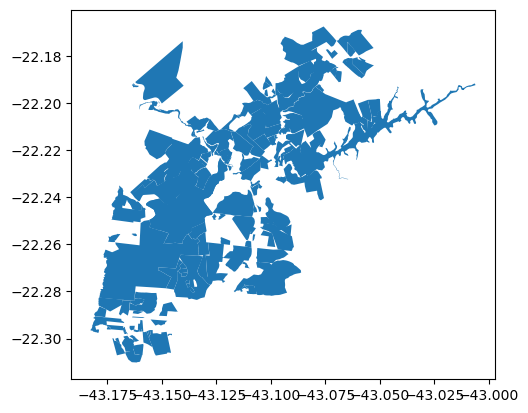

In [ ]:
df_perim_rj_areal.plot()

### CRS

Coordinate Reference System (CRS)

A base de dados vem com EPSG 4674 (geometria pra plotar)

mas o cálculo da área dos polígonos bate apenas com o EPSG 6933 (geometria para calcular area)

In [ ]:
df_perim_rj_areal.crs # EPSG 4674

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [ ]:
df_perim_rj_areal.to_crs(crs=6933).area/10000 # 10.000m² = 1 ha (=~ campo de futebol)

55269      4.509353
55270     45.603238
55271      8.160305
55272     53.991403
55273    237.152533
            ...    
55454     19.087993
55455      0.214539
55456     34.786841
55457     94.616484
55458      8.844779
Length: 190, dtype: float64

In [ ]:
df_perim_rj_areal['geometry_4674'] = df_perim_rj_areal['geometry']
df_perim_rj_areal['geometry'] = df_perim_rj_areal['geometry'].to_crs(crs=6933)
df_perim_rj_areal['vlr_area']  = df_perim_rj_areal['geometry'].area/10000

#### Tarefa 1

Procurar qual o melhor CRS usar para calculo de área das propriedades rurais (unidades espaciais que variam até o tamanho de municípios inteiros). Fazer uma pesquisa disso e depois comparar com o CRS atual que dá uma ligeira diferença entre a área calculada pelo geopandas e a area informada do imóvel

dúvida importante: quando o usuário define as coordenadas na plataforma do CAR, a área do imóvel é informada automaticamente? ou seja, tem um sistema por trás que calcula? e é essa informação que temos no dataframe em vlr_area?)

## Plotly

In [ ]:
df_perim_rj_areal = df_perim_rj_areal[
                   (df_perim_rj_areal['des_condic'] != 'cancelado por decisao administrativa')
                 & (df_perim_rj_areal['des_condic'] != 'cancelado por duplicidade')
                 & (df_perim_rj_areal['des_condic'] != 'cancelado por solicitacao do proprietario/possuidor')
                            ]

In [ ]:
df_perim_rj_areal['des_condic'].value_counts()

des_condic
aguardando analise                                 184
analisado, aguardando atendimento a notificacao      6
Name: count, dtype: int64

In [ ]:
# não pode ter duplos para plotar no mapa
df_perim_rj_areal['cod_imovel'].value_counts()

cod_imovel
rj-3300225-b04e458855ff4964b72e11140e0de362    1
rj-3300225-88d67c3579f748acbcce0c6d36d154d0    1
rj-3300225-6ca7462a846c43e1918fa44f35ad092d    1
rj-3300225-6e86fea3eda14a3c90bf74ee23dd3eec    1
rj-3300225-6eb9a6b0f0d9432ca4317fd0e6bdb573    1
                                              ..
rj-3300225-4196673814db41bf92279cc6a69c9f46    1
rj-3300225-1f3b571707ce46edb1eba2ecf6f70593    1
rj-3300225-21509061744a4bb8b4c6d5c95e429d19    1
rj-3300225-442877d09bdd4584999a80f7d3de47f1    1
rj-3300225-f308d1939b2248f3bccbb9e5b9a4cd02    1
Name: count, Length: 190, dtype: int64

In [ ]:
# for maps, we must specify spatial units as the df's index
df_perim_rj_areal.set_index('cod_imovel', inplace = True)

In [ ]:
df_perim_rj_areal['sequencia'] = range(1, len(df_perim_rj_areal) + 1)

### Geomap

In [ ]:
# dá para ver que há muitas sobreposições e conflitos
fig = px.choropleth(df_perim_rj_areal, # the database
                     geojson = df_perim_rj_areal['geometry_4674'], # which column contains the poligons
                     color = df_perim_rj_areal['vlr_area'], # which value should we plot in each spatial unit (poligon)
                     locations = df_perim_rj_areal.index,
                     hover_data = {'sequencia': True}
                   )
fig.update_geos(fitbounds="locations", # ajust zoom to locations
                visible=False, # ajust to not show world map
                )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) # fit map in figure
fig.update_traces(marker_opacity=0.5)  # Set the desired opacity (0.0 to 1.0)

fig.show()

#### Dash Viz

In [ ]:
def create_choropleth(selected_location=None):
    fig = px.choropleth(df_perim_rj_areal,
                        geojson=df_perim_rj_areal['geometry_4674'],
                        color=df_perim_rj_areal['vlr_area'],
                        locations=df_perim_rj_areal.index,
                        hover_data = {'sequencia': True}
                        )
    fig.update_geos(fitbounds="locations",
                    visible=False,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_perim_rj_areal.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_perim_rj_areal.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(host = 'localhost',
                   port = 8053,
                   debug=True)

### Mapbox

In [ ]:
fig = px.choropleth_mapbox(df_perim_rj_areal,
                           geojson = df_perim_rj_areal['geometry_4674'], # which column contains the poligons
                           color = df_perim_rj_areal['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_perim_rj_areal.index,

                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           # mapbox has opacity arg insice choropleth_mapbox()
                           opacity = 0.6,  # [0,1] interval
                           hover_data = {'sequencia': True}
                           )

fig.update_geos(fitbounds="locations", # ajust zoom to locations
                visible=False, # ajust to not show world map
                )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}) # fit map in figure
fig.update_traces(marker_opacity=0.5)  # Set the desired opacity (0.0 to 1.0)

fig

#### Dash Viz

In [ ]:
def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_perim_rj_areal,
                           geojson = df_perim_rj_areal['geometry_4674'], # which column contains the poligons
                           color = df_perim_rj_areal['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_perim_rj_areal.index,

                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_perim_rj_areal.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_perim_rj_areal.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True,
                  port = 8053)

Imóveis que claramente tratam-se do MESMO IMÓVEL, mas com alterações na área e que contém códigos de imóvel diferentes

In [ ]:
# exemplo 1 --> acima e à direita
df_perim_rj_areal[(df_perim_rj_areal['sequencia'] == 18)
              | (df_perim_rj_areal['sequencia'] == 70)]

,cod_tema,nom_tema,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,geometry_4674,vlr_area,sequencia
cod_imovel,,,,,,,,,,,,,
rj-3300225-768ede093c9349ea978f60883de869fa,area_imovel,area do imovel,2.6214,73.3991,at,iru,aguardando analise,areal,rj,"POLYGON ((-4154964.667 -2764653.089, -4154988....","POLYGON ((-43.06275 -22.20928, -43.06300 -22.2...",73.385413,18
rj-3300225-24885b7da6124723b5e4148bc2155854,area_imovel,area do imovel,2.9759,83.3263,at,iru,aguardando analise,areal,rj,"POLYGON ((-4154281.592 -2764908.697, -4154291....","POLYGON ((-43.05567 -22.21144, -43.05577 -22.2...",83.310860,70


In [ ]:
# exemplo 2 -> ao centro à esquerda
df_perim_rj_areal[(df_perim_rj_areal['sequencia'] == 103)
              | (df_perim_rj_areal['sequencia'] == 37)]

,cod_tema,nom_tema,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,geometry_4674,vlr_area,sequencia
cod_imovel,,,,,,,,,,,,,
rj-3300225-4cd0e9a9387247e0861af5657b72e61d,area_imovel,area do imovel,19.5025,546.0702,at,iru,aguardando analise,areal,rj,"POLYGON ((-4160713.603 -2767444.608, -4160734....","POLYGON ((-43.12233 -22.23287, -43.12255 -22.2...",546.010928,37
rj-3300225-407e6f1d327e4041b5e7acffe6af77f2,area_imovel,area do imovel,16.4891,461.6956,at,iru,aguardando analise,areal,rj,"POLYGON ((-4160801.988 -2766290.551, -4160787....","POLYGON ((-43.12325 -22.22312, -43.12310 -22.2...",461.645146,103


# Base Temas Ambientais

A base que está sendo usada nesse notebook é resultado de um filtro da base original, onde são escolhidas apenas as últimas atualizações dos imóveis. Ocorre que na base original, as mesmas informações se repetem apenas com datas de atualização do banco diferentes provavelmente porque o banco foi atualizando com o tempo.

In [ ]:
# from pyspark.sql import SparkSession
# from pyspark.sql.functions import col, lower, trim, to_date
# from pyspark.sql.window import Window
# import pyspark.sql.functions as F

# # Create a Spark session
# spark = SparkSession.builder \
#    .appName("CSV Reader") \
#    .getOrCreate()
# #Path to the CSV file
# temas_amb_dir = r"D:\OneDrive\0_dataviva\0_projetos\car\Dados CAR - Portal Dados Abertos - Temas Ambientais e Sobreposição de Cadastros\temas_ambientais.csv"

# #Read the CSV file
# df = spark.read.csv(temas_amb_dir,
#                     header=True,
#                     inferSchema=True,
#                     sep = ';')

# #df_areal = df.filter(df.municipio == 'Areal')
# #df_areal.toPandas().to_csv('temas_ambientais_areal.csv', index = False)

In [ ]:
#df.count()

In [ ]:
#df.select("registro_car").distinct().count()

In [ ]:
# # Convert column names to lower case and strip whitespaces
# df = df.toDF(*[c.lower().strip() for c in df.columns])
# from pyspark.sql.types import StringType
# # Strip whitespaces from string columns
# string_columns = [field.name for field in df.schema.fields if field.dataType == StringType()]
# for col_name in string_columns:
#     df = df.withColumn(col_name, trim(col(col_name)))
# # Convert string columns to lower case
# for col_name in string_columns:
#     df = df.withColumn(col_name, lower(col(col_name)))
# # Convert specific columns to datetime
# df = df.withColumn('data_ultima_retificacao', to_date(col('data_ultima_retificacao')))
# df = df.withColumn('data_inscricao', to_date(col('data_inscricao')))
# # Sort values by 'registro_car' and 'data_ultima_retificacao'
# window_spec = Window.partitionBy('registro_car').orderBy('data_ultima_retificacao')
# # Add a row number to each partition to simulate groupby and head(1) operation
# df = df.withColumn('row_number', F.row_number().over(window_spec))
# # Filter to get the first row in each group
# df = df.filter(col('row_number') == 1).drop('row_number')

In [ ]:
# # parece que deu certo. Só resta o nº de registros únicos (apenas os mais atualizados)
# df.count()

In [ ]:
#df.write.csv('temas_ambientais_apenas_ultima_atualizacao.csv', header=True)

In [ ]:
os.getcwd()

'D:\\OneDrive\\0_dataviva\\0_projetos\\car\\Dados CAR - Consulta Pública\\1_Análise de dados\\RJ\\1_dados_e_notebooks'

In [ ]:
csv_spark_path = os.getcwd() + '\\' + 'temas_ambientais_apenas_ultima_atualizacao.csv'
# List all CSV files in the directory
csv_files = [os.path.join(csv_spark_path, f) for f in os.listdir(csv_spark_path) if f.endswith('.csv')]
# Read each CSV file and concatenate them into a single DataFrame
df_list = [pd.read_csv(file) for file in csv_files]
temas_amb = pd.concat(df_list, ignore_index=True)

In [ ]:
if temas_amb['registro_car'].nunique() == len(temas_amb):
    print('A base possui apenas registros únicos')

A base possui apenas registros únicos


In [ ]:
temas_amb.head(1)

,uf,municipio,codigo_ibge,area_do_imovel,registro_car,situacao_cadastro,condicao_cadastro,area_liquida,area_remanescente_vegetacao_nativa,area_reserva_legal_proposta,area_preservacao_permanente,area_nao_classificada,solicitacao_adesao_pra,latitude,longitude,data_inscricao,data_alteracao_condicao_cadastro,area_rural_consolidada,area_servidao_administrativa,tipo_imovel_rural,modulos_fiscais,area_uso_restrito,area_reserva_legal_averbada,area_reserva_legal_aprovada_nao_averbada,area_pousio,data_ultima_retificacao
0,ac,acrelândia,1200013,46.8241,ac-1200013-016e1d4e21244c37b380aa8b7a330192,pe,"analisado com pendências, aguardando retificaç...",46.8241,6.357441,0.0,0.0,0.0,sim,-10.100064,-66.96323,2015-02-10,NaN,40.466698,0.0,iru,0.4682,0.0,0.0,0.0,0.0,2020-01-08


In [ ]:

temas_amb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6835450 entries, 0 to 6835449
Data columns (total 26 columns):
 #   Column                                    Dtype  
---  ------                                    -----  
 0   uf                                        object 
 1   municipio                                 object 
 2   codigo_ibge                               int64  
 3   area_do_imovel                            float64
 4   registro_car                              object 
 5   situacao_cadastro                         object 
 6   condicao_cadastro                         object 
 7   area_liquida                              float64
 8   area_remanescente_vegetacao_nativa        float64
 9   area_reserva_legal_proposta               float64
 10  area_preservacao_permanente               float64
 11  area_nao_classificada                     float64
 12  solicitacao_adesao_pra                    object 
 13  latitude                                  float64
 14  lo

In [ ]:
temas_amb_rj = temas_amb[temas_amb['uf'] == 'rj'].copy()
temas_amb_areal = temas_amb_rj[temas_amb_rj['municipio'] == 'areal'].copy()

In [ ]:
# só tem registros únicos para AREAL --> tentar depois outra cidade
temas_amb_areal[['registro_car','situacao_cadastro', 'condicao_cadastro',
                'data_inscricao', 'data_alteracao_condicao_cadastro',
                'data_ultima_retificacao']]['registro_car'].value_counts()

registro_car
rj-3300225-24885b7da6124723b5e4148bc2155854    1
rj-3300225-55207b6cc43e4537b1ec63cbd6dda331    1
rj-3300225-b0a06d647ed341638a9cc4c62393d3a2    1
rj-3300225-ca30beb9f1bc4c95928892890dee460e    1
rj-3300225-eb227795f9d143f897635fc694a181b4    1
                                              ..
rj-3300225-682384ba854847e591797e85ba68d945    1
rj-3300225-7e7ff62d64444aab92f3f4bbdc9c0a7e    1
rj-3300225-a3adeb2b66b7457e9f666e4bf0b89f76    1
rj-3300225-a478b8516bfa4a128aa79b4cca2f654f    1
rj-3300225-cb97896cc9ba4c66b301abf112b1cbf9    1
Name: count, Length: 169, dtype: int64

In [ ]:
# AS OPERAÇÕES ABAIXO JÁ ESTÃO SENDO FEITAS DURANTE A LEITURA DO PYSPARK
# temas_amb_areal.columns = temas_amb_areal.columns.str.lower().str.strip()
# # Nos dados das colunas
# temas_amb_areal = temas_amb_areal.apply(lambda x: x.str.strip() if x.dtype == 'object' else x)
# temas_amb_areal = temas_amb_areal.apply(lambda x: x.str.lower() if x.dtype == 'object' else x)
# temas_amb_areal['data_ultima_retificacao'] = pd.to_datetime(temas_amb_areal['data_ultima_retificacao'])
# temas_amb_areal['data_inscricao'] = pd.to_datetime(temas_amb_areal['data_inscricao'])
# temas_amb_areal.sort_values(by=['registro_car', 'data_ultima_retificacao'], inplace=True)
# temas_amb_areal = temas_amb_areal.groupby('registro_car').head(1)

In [ ]:
# plotar dados da base temas ambientais
temas_amb_areal_unique = temas_amb_areal['registro_car'].unique()
df_perim_rj_areal.reset_index(inplace=True)
df_perim_rj_areal_in_temas_amb = df_perim_rj_areal[df_perim_rj_areal['cod_imovel'].isin(temas_amb_areal_unique)]
df_perim_rj_areal_in_temas_amb.set_index('cod_imovel', inplace=True)

def create_choropleth(selected_location=None):
    fig = px.choropleth(df_perim_rj_areal_in_temas_amb,
                        geojson=df_perim_rj_areal_in_temas_amb['geometry_4674'],
                        color=df_perim_rj_areal_in_temas_amb['vlr_area'],
                        locations=df_perim_rj_areal_in_temas_amb.index,
                        hover_data = {'sequencia': True}
                        )
    fig.update_geos(fitbounds="locations",
                    visible=False,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_perim_rj_areal_in_temas_amb.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_perim_rj_areal_in_temas_amb.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(host = 'localhost',
                   port = 8053,
                   debug=True)

Também os imóveis na base de temas ambientais se sobrepoem

# Algoritmo intra-cidade

A ideia central do algorítmo é trabalhar com os dados que possuem as datas na base temas ambientais,

por isso a primeira coisa a fazer é filtrar df_perim_rj_areal por aqueles códigos que também estão naquela base

## Checks

In [ ]:
len(df_perim_rj_areal), len(temas_amb_areal)

(190, 169)

In [ ]:
df_perim_rj_areal = df_perim_rj_areal[
    df_perim_rj_areal['cod_imovel'].isin(temas_amb_areal['registro_car'].unique())]

In [ ]:
len(df_perim_rj_areal)

169

In [ ]:
temas_amb_areal.head(1)

,uf,municipio,codigo_ibge,area_do_imovel,registro_car,situacao_cadastro,condicao_cadastro,area_liquida,area_remanescente_vegetacao_nativa,area_reserva_legal_proposta,area_preservacao_permanente,area_nao_classificada,solicitacao_adesao_pra,latitude,longitude,data_inscricao,data_alteracao_condicao_cadastro,area_rural_consolidada,area_servidao_administrativa,tipo_imovel_rural,modulos_fiscais,area_uso_restrito,area_reserva_legal_averbada,area_reserva_legal_aprovada_nao_averbada,area_pousio,data_ultima_retificacao
296545,rj,areal,3300225,83.3263,rj-3300225-24885b7da6124723b5e4148bc2155854,at,"aguardando análise, não passível de revisão de...",82.3971,33.28959,21.8528,6.645833,48.690898,sim,-22.204545,-43.062638,2018-05-04,NaN,0.292049,0.929211,iru,2.9759,0.0,0.0,0.0,0.0,2018-05-04


In [ ]:
# trazendo a coluna de data de inscrição do imóvel (para distinguir entre mais antigo e mais novo)
df_perim_rj_areal = df_perim_rj_areal.merge(
                     temas_amb_areal[['registro_car', 'data_inscricao', 'codigo_ibge']],
                     how = 'left',
                     left_on = 'cod_imovel',
                     right_on = 'registro_car')
df_perim_rj_areal.drop('registro_car', axis = 1, inplace=True)

In [ ]:
def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_perim_rj_areal,
                           geojson = df_perim_rj_areal['geometry_4674'], # which column contains the poligons
                           color = df_perim_rj_areal['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_perim_rj_areal.index,

                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_perim_rj_areal.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_perim_rj_areal.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port = 8053)

In [ ]:
df_perim_rj_areal.query("sequencia == 178")

,index,cod_imovel,cod_tema,nom_tema,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,geometry_4674,vlr_area,sequencia,data_inscricao,codigo_ibge
156,177,rj-3300225-d3e3f85742ee4f2fb1aadb4a1b7dd00b,area_imovel,area do imovel,7.6788,209.9772,at,iru,aguardando analise,areal,rj,"POLYGON ((-4161813.112 -2771992.331, -4161756....","POLYGON ((-43.13373 -22.27132, -43.13314 -22.2...",209.953808,178,2014-08-20,3300225


## Funções

ATENÇÃAAAAAAO:

as funções de dropar e atualizar geometria operam diretamente no dataframe que recebem pois usam .loc[]

qualquer outra alteração feita no dataframe que não use .loc[] a função tem que retornar o dataframe

### Funções Base

In [ ]:
def extrair_info_propriedade(cod_imovel, df):
    df_propriedade = df[df['cod_imovel'] == cod_imovel]
    if df_propriedade.empty:
        return None, None, None
    area = df[df['cod_imovel'] == cod_imovel]['vlr_area'].iloc[0]
    data = df[df['cod_imovel'] == cod_imovel]['data_inscricao'].iloc[0]
    return df_propriedade, area, data

# funções para dropar geometria
def dropar_imovel_do_dataframe(cod_imovel, df):
    df.drop(df.loc[df['cod_imovel'] == cod_imovel].index, inplace=True)

def dropar_geometria_mais_antiga(cod_a, cod_b,
                                 data_a, data_b,
                                 df):
    if data_a > data_b:
        dropar_imovel_do_dataframe(cod_b, df)
    elif data_a < data_b:
        dropar_imovel_do_dataframe(cod_a, df)
    else: # para fins analíticos, tanto faz qual dropa
        dropar_imovel_do_dataframe(cod_b, df)

# funções para atualizar geometria
def atualizar_geometria(df, cod_imovel, nova_geometria):
    df.loc[df['cod_imovel'] == cod_imovel, 'geometry'] = nova_geometria

def desmembramento_ou_juncao(nova_geometria):
    if nova_geometria.area == 0:
        return 'juncao'
    else:
        return 'desmembramento'

def atualizar_geometria_mais_antiga(cod_a, cod_b,
                                    data_a, data_b,
                                    df_propriedade_a, df_propriedade_b,
                                    df,
                                    identificar_desmembramento_ou_juncao = False):
    classificacao = None
    if data_a > data_b:
        nova_geometria = df_propriedade_b.difference(df_propriedade_a, align=False).iloc[0]
        atualizar_geometria(df, cod_b, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    elif data_a < data_b:
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        atualizar_geometria(df, cod_a, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    else: # para fins analíticos, tanto faz qual atualiza se não temos mais outra referencia para usar
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        atualizar_geometria(df, cod_a, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    return classificacao

# funções para lidar com os restos de polígonos após os calculos de atualização de geometria
def extrair_multipoligonos(geometry):
    if geometry.geom_type == 'GeometryCollection':
        return [geom for geom in geometry.geoms if geom.geom_type in ['Polygon', 'MultiPolygon']]
    else:
        return geometry

def resolver_multipoligonos(df):
    df['poligonos'] = df['geometry'].apply(extrair_multipoligonos)
    df = df.explode('poligonos')
    df = df[df['poligonos'].notnull()]
    df.set_geometry('poligonos', inplace=True)
    df['geometry'] = df['poligonos']
    df.reset_index(inplace=True)
    df.drop('index', axis = 1, inplace=True)
    df['geometry'].set_crs(crs = 6933, inplace=True)
    df['vlr_area'] = df['geometry'].area/10000
    df['geometry_4674'] = df['geometry'].to_crs(crs=4674)
    return df

#### Testes

##### teste desmembramento/juncao

Se está classificando direito

In [ ]:
df_perim_rj_areal[df_perim_rj_areal['sequencia'].isin([10,47])]

,index,cod_imovel,cod_tema,nom_tema,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,geometry_4674,vlr_area,sequencia,data_inscricao,codigo_ibge
5,9,rj-3300225-f6313a500b944227861cfc8693b7046e,area_imovel,area do imovel,0.1901,5.3214,at,iru,aguardando analise,areal,rj,"POLYGON ((-4156489.725 -2766514.650, -4156597....","POLYGON ((-43.07856 -22.22501, -43.07968 -22.2...",5.320523,10,2022-04-11,3300225
26,46,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,area_imovel,area do imovel,29.1579,468.8179,pe,iru,"analisado, aguardando atendimento a notificacao",areal,rj,"POLYGON ((-4157434.024 -2765850.161, -4157352....","POLYGON ((-43.08834 -22.21940, -43.08750 -22.2...",468.730885,47,2017-12-30,3300225


In [ ]:
df_perim_rj_areal2 = df_perim_rj_areal.copy()
cod_a = 'rj-3300225-f6313a500b944227861cfc8693b7046e' # 10
cod_b = 'rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846' # 47
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df = df_perim_rj_areal2)
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df = df_perim_rj_areal2)
area_a, area_b

(5.320522754142834, 468.7308851682561)

In [ ]:
if 'classificacao' in locals():
    print('var existe')
else:
    print('var NÃO existe')

var NÃO existe


In [ ]:
classificacao = atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                  data_a = data_a, data_b = data_b,
                                                  df_propriedade_a = df_propriedade_a,
                                                  df_propriedade_b = df_propriedade_b,
                                                  df = df_perim_rj_areal2,
                                                  identificar_desmembramento_ou_juncao = True)

In [ ]:
classificacao

'desmembramento'

##### Deu certo

In [ ]:
df_perim_rj_areal[df_perim_rj_areal['sequencia'].isin([165,48])]

,index,cod_imovel,cod_tema,nom_tema,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,geometry_4674,vlr_area,sequencia,data_inscricao,codigo_ibge
27,47,rj-3300225-009ec4a0bc394f0cb204a86a1daf0b3c,area_imovel,area do imovel,1.4681,41.1064,at,iru,aguardando analise,areal,rj,"POLYGON ((-4159741.726 -2771469.744, -4159861....","POLYGON ((-43.11226 -22.26690, -43.11351 -22.2...",41.100988,48,2015-12-15,3300225
143,164,rj-3300225-c17886f144f04054979fa88943b7ccba,area_imovel,area do imovel,2.3322,65.3010,at,iru,aguardando analise,areal,rj,"POLYGON ((-4160209.629 -2770859.009, -4160227....","POLYGON ((-43.11711 -22.26173, -43.11729 -22.2...",65.291394,165,2020-02-14,3300225


In [ ]:
df_perim_rj_areal2 = df_perim_rj_areal.copy()
cod_a = 'rj-3300225-c17886f144f04054979fa88943b7ccba' # 165
cod_b = 'rj-3300225-009ec4a0bc394f0cb204a86a1daf0b3c' # 48
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df = df_perim_rj_areal2)
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df = df_perim_rj_areal2)
area_a, area_b

(65.29139385922002, 41.100988063406085)

In [ ]:
atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                              data_a = data_a, data_b = data_b,
                              df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                              df = df_perim_rj_areal2)
df_perim_rj_areal2['vlr_area'] = df_perim_rj_areal2['geometry'].area/10000
df_perim_rj_areal2['geometry_4674'] = df_perim_rj_areal2['geometry'].to_crs(crs=4674)
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df = df_perim_rj_areal2)
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df = df_perim_rj_areal2)
area_a, area_b, data_a, data_b,

(65.29139385922002, 31.514612777461792, '2020-02-14', '2015-12-15')

(<Axes: >, <Axes: >)

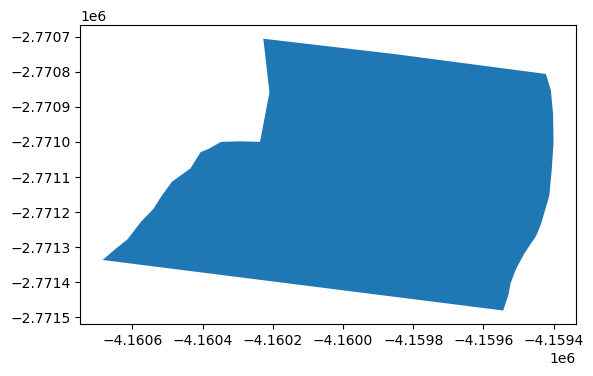

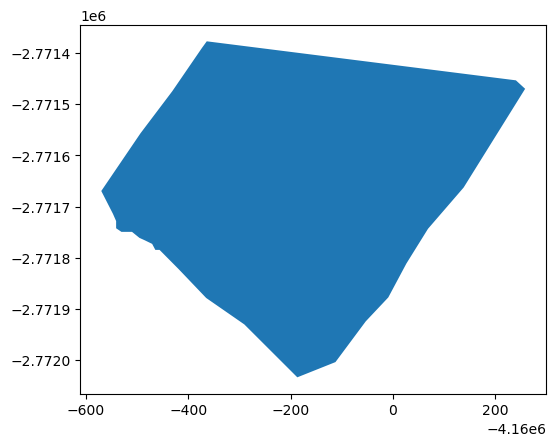

In [ ]:
df_propriedade_a.plot(), df_propriedade_b.plot()

##### Depois deu

In [ ]:
df_perim_rj_areal[df_perim_rj_areal['sequencia'].isin([79,80])]

,index,cod_imovel,cod_tema,nom_tema,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,geometry_4674,vlr_area,sequencia,data_inscricao,codigo_ibge
58,78,rj-3300225-4ce8fbb40b42406b830d483ce3813c5e,area_imovel,area do imovel,1.9874,55.6482,at,iru,aguardando analise,areal,rj,"POLYGON ((-4156671.365 -2761600.928, -4156552....","POLYGON ((-43.08044 -22.18349, -43.07920 -22.1...",55.639096,79,2014-10-30,3300225
59,79,rj-3300225-37b70197e88949939e7b7071afc32a1a,area_imovel,area do imovel,2.3997,67.1913,at,iru,aguardando analise,areal,rj,"POLYGON ((-4155637.733 -2761719.089, -4155653....","POLYGON ((-43.06973 -22.18449, -43.06989 -22.1...",67.179763,80,2016-04-26,3300225


In [ ]:
df_perim_rj_areal2 = df_perim_rj_areal.copy()
cod_a = 'rj-3300225-4ce8fbb40b42406b830d483ce3813c5e' # 79
cod_b = 'rj-3300225-37b70197e88949939e7b7071afc32a1a' # 80
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df = df_perim_rj_areal2)
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df = df_perim_rj_areal2)
area_a, area_b

(55.6390960023775, 67.1797629931507)

In [ ]:
atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                              data_a = data_a, data_b = data_b,
                              df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                              df = df_perim_rj_areal2)
df_perim_rj_areal2['vlr_area'] = df_perim_rj_areal2['geometry'].area/10000
df_perim_rj_areal2['geometry_4674'] = df_perim_rj_areal2['geometry'].to_crs(crs=4674)
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df = df_perim_rj_areal2)
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df = df_perim_rj_areal2)
area_a, area_b, data_a, data_b

(52.31547614785648, 67.1797629931507, '2014-10-30', '2016-04-26')

<Axes: >

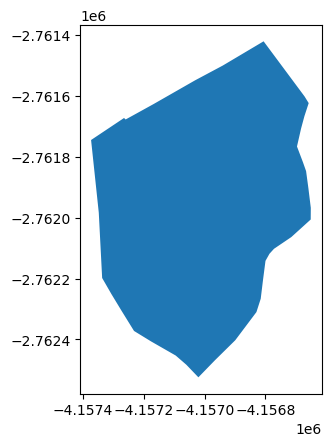

In [ ]:
df_propriedade_a.plot()

In [ ]:
df_limpo_data_viz = df_perim_rj_areal2.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8053)

Teste mesmo dropar imovel: ok

df_perim_rj_areal2 = df_perim_rj_areal.copy()
cod_a = 'rj-3300225-768ede093c9349ea978f60883de869fa' #
cod_b = 'rj-3300225-24885b7da6124723b5e4148bc2155854'
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df = df_perim_rj_areal2)
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df = df_perim_rj_areal2)
len(df_perim_rj_areal2)   
df_propriedade_a.plot(), df_propriedade_b.plot()       
dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                          data_a = data_a, data_b = data_b,
                          df = df_perim_rj_areal2)
len(df_perim_rj_areal2)   

Teste Resolver Multipolígonos: ok

Houve muitos desmembramentos. O arquivo de geometria parece não ser um polígono, mas uma GEOMETRYCOLLECTION

In [ ]:
# cod = 'rj-3300225-d3e3f85742ee4f2fb1aadb4a1b7dd00b'
# relat[(relat['cod_a'] == cod) | (relat['cod_b'] == cod)]['classificacao'].value_counts()
# df_perim_rj_areal_test.query("cod_imovel == @cod")
# # os demais parecem ser polígonos ou multipoligonos
# df_perim_rj_areal_test.sample(1)
# # a plotagem dá certo no plot, mas não no gráfico interativo
# df_perim_rj_areal_test.query("cod_imovel == @cod")['geometry_4674'].plot()
# # quao grave é o problema
# # fazer uma cópia para alterar as geometrias
# df_limpo_data_viz = df_perim_rj_areal_test.copy()
# # poucos resultados deverão ser geometryCollection
# df_limpo_data_viz['geometry'].apply(lambda x: x.geom_type).value_counts()
# # parece dar certo
# df_limpo_data_viz.query("cod_imovel == @cod")['geometry'].apply(extract_polygons)
# df_limpo_data_viz['poligonos'] = df_limpo_data_viz['geometry'].apply(extract_polygons)
# # explode vai criar uma linha para cada polígono de um dataframe multipoligono
# df_limpo_data_viz = df_limpo_data_viz.explode('poligonos')
# df_limpo_data_viz = df_limpo_data_viz[df_limpo_data_viz['poligonos'].notnull()]
# df_limpo_data_viz.set_geometry('poligonos', inplace=True)
# df_limpo_data_viz.head(1)
#  # pq poligonos que foram divididos em mais de uma linha vao ficar com mesmo index
# df_limpo_data_viz.reset_index(inplace=True)
# df_limpo_data_viz.drop('index', axis = 1, inplace=True) # para nao confundir
# df_limpo_data_viz.head(1)
# # é por isso que o geometry coolection desaparece e aparecem 4 novos polígonos
# df_limpo_data_viz['poligonos'].apply(lambda x: x.geom_type).value_counts()
# # a única coisa que difere é a coluna polígonos, mas calma...
# df_limpo_data_viz.query("cod_imovel == @cod")
# df_limpo_data_viz.query("cod_imovel == @cod")['poligonos'].plot() # a plotagem dá certo no matplotlib
# df_limpo_data_viz['poligonos'].crs # poligonos não vem com crs
# # set para 6933 --> para recalcular a área
# df_limpo_data_viz['poligonos'].set_crs(crs = 6933, inplace=True)
# df_limpo_data_viz['poligonos'].crs
# # as areas dos polígonos novos estão diferentes do original, claro
# (df_limpo_data_viz['vlr_area'] == df_limpo_data_viz['poligonos'].area/10000).value_counts()
# # atualizar área
# df_limpo_data_viz['vlr_area'] = df_limpo_data_viz['poligonos'].area/10000
# # atualizar a geometria de plotagem
# df_limpo_data_viz['geometry_4674'] = df_limpo_data_viz['poligonos'].to_crs(crs=4674)
# # agora veja só que a área difere muito também
# df_limpo_data_viz.query("cod_imovel == @cod")
# # se for plotar cada um dos polígonos gerados, vai ver que apenas o index 154 de fato representa a área original
# df_limpo_data_viz.query("cod_imovel == @cod").loc[[154]].plot()

### Função main

In [ ]:
def identificar_e_transformar_propriedades_na_mesma_cidade(df,
                                                           prioridade_mesma_propriedade = True,
                                                           dict_relatorio = None):
    alpha = 0.70
    beta = 0.70
    theta = 0.80

    cod_imoveis_unicos = df['cod_imovel'].unique().tolist()
    combinacoes = list(itertools.combinations(cod_imoveis_unicos, 2))

    # criar relatório se nao existe
    # global dict_relatorio
    if dict_relatorio is None:
        dict_relatorio = {'cod_a' : [], 'seq_a' : [],
                          'cod_b' : [], 'seq_b' : [], 'classificacao' : []}

    for cod_a, cod_b in tqdm(combinacoes, leave=False):
        df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df)
        df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df)

        if df_propriedade_a is None or df_propriedade_b is None:
            continue # skipar o resto da interação se for None

        df_intersection = df_propriedade_a.overlay(df_propriedade_b,
                                                   how='intersection',
                                                   keep_geom_type=True)
        # relatorio
        seq_a = df_propriedade_a['sequencia'].iloc[0]
        seq_b = df_propriedade_b['sequencia'].iloc[0]
        classificacao = 'nao_definida' # caso em que se esta verificando apenas se é a mesma propried

        if df_intersection.empty:
            classificacao = 'vazia'
        else:
            area_intersecao = (df_intersection['geometry'].area / 10000).iloc[0]
            # talvez chamar tudo aqui abaixo de "def classificar_e_resolver_intersecao()"
            if area_a == area_b:
                if area_intersecao == area_a:
                    classificacao = 'mesma_propriedade_areas_iguais'
                    dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                 data_a = data_a, data_b = data_b,
                                                 df = df)
                else:
                    if not prioridade_mesma_propriedade:
                        classificacao = 'intersecao_areas_iguais'
                        atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                      data_a = data_a, data_b = data_b,
                                                      df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                      df = df,
                                                      identificar_desmembramento_ou_juncao = False)
            else:
                if min(area_a, area_b) >= alpha*max(area_a, area_b): # as areas sao semelhantes
                    if area_intersecao >= beta*min(area_a, area_b): # a intersecao é grande
                        classificacao = 'mesma_propriedade_areas_diferentes'
                        dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                  data_a = data_a, data_b = data_b,
                                                  df = df)
                    else:
                        if not prioridade_mesma_propriedade:
                            classificacao = 'intersecao_areas_semelhantes_intersecao_pequena'
                            atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                          data_a = data_a, data_b = data_b,
                                                          df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                          df = df)
                else:
                    if not prioridade_mesma_propriedade:
                        if area_intersecao >= theta*min(area_a, area_b):
                            classificacao = 'intersecao_desmembramento_ou_juncao'
                            classificacao = atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                          data_a = data_a, data_b = data_b,
                                                          df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                          df = df,
                                                          identificar_desmembramento_ou_juncao = True)
                        else:
                            classificacao = 'intersecao_areas_diferentes'
                            atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                          data_a = data_a, data_b = data_b,
                                                          df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                          df = df)
        # preencher relatório após cada interação
        dict_relatorio['cod_a'].append(cod_a)
        dict_relatorio['seq_a'].append(seq_a)
        dict_relatorio['cod_b'].append(cod_b)
        dict_relatorio['seq_b'].append(seq_b)
        dict_relatorio['classificacao'].append(classificacao)

        df['vlr_area'] = df['geometry'].area/10000
    # construir a geometria de visualização
    df['geometry_4674'] = df['geometry'].to_crs(crs=4674)

    return df, dict_relatorio

### Função Wrap

In [ ]:
def gerar_dataframe_e_relatorio_tratado_por_municipio(df):
    df, dict_relatorio = identificar_e_transformar_propriedades_na_mesma_cidade(
                                        df,
                                        prioridade_mesma_propriedade = True)

    df, dict_relatorio = identificar_e_transformar_propriedades_na_mesma_cidade(
                                        df,
                                        prioridade_mesma_propriedade = False,
                                        dict_relatorio = dict_relatorio)
    df = resolver_multipoligonos(df)
    # talvez depois incluir um drop para geometrias menores que x area
    # que podem ser pequenos restos dos multipoligonos
    return df, dict_relatorio

## Run

1) preambulo

In [ ]:
len(df_perim_rj_areal) # tamanho do df original

169

In [ ]:
df_perim_rj_areal_test = df_perim_rj_areal.copy()

2) rodagem

In [ ]:
df_perim_rj_areal_test, dict_relatorio = gerar_dataframe_e_relatorio_tratado_por_municipio(df_perim_rj_areal_test)

3) diagnóstico

In [ ]:
len(df_perim_rj_areal_test)

## Relatório

In [ ]:
relat = pd.DataFrame(dict_relatorio)
relat['classificacao'].value_counts()

In [ ]:
relat = relat[relat['classificacao']!= 'nao_definida'] # os casos que foram pulados por prioridade

In [ ]:
relat[relat['classificacao'] == 'mesma_propriedade_areas_diferentes']
# um filtro das mesmas propriedades

In [ ]:
relat['classificacao'].value_counts()

## Nova Viz

In [ ]:
df_limpo_data_viz = df_perim_rj_areal_test.copy()
#df_limpo_data_viz = df_perim_rj_areal.copy()
#df_limpo_data_viz = df_multipoligon_test.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

In [ ]:
relat[(relat['seq_a'] == 79) & (relat['seq_b'] == 80)]

In [ ]:
relat['classificacao'].value_counts()

# Algoritmo inter-cidades

## Intro

In [ ]:
malha_path = 'D:\\OneDrive\\0_dataviva\\0_projetos\\car\\dados_ibge_br_municipios_2022'
df_malha_municipios = gpd.read_file(fr'{malha_path}\BR_Municipios_2022.shp')

In [ ]:
df_malha_municipios.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5572 entries, 0 to 5571
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   CD_MUN    5572 non-null   object  
 1   NM_MUN    5572 non-null   object  
 2   SIGLA_UF  5572 non-null   object  
 3   AREA_KM2  5572 non-null   float64 
 4   geometry  5572 non-null   geometry
dtypes: float64(1), geometry(1), object(3)
memory usage: 217.8+ KB


In [ ]:
df_malha_municipios.columns = ['cod_municipio', 'desc_municipio', 'sigla_uf', 'area_km2', 'geometry']

In [ ]:
df_malha_municipios.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Latin America - Central America and South America - onshore and offshore. Brazil - onshore and offshore.
- bounds: (-122.19, -59.87, -25.28, 32.72)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [ ]:
df_malha_municipios.set_index('cod_municipio', inplace=True)

## Matriz de Vizinhança

In [ ]:
# Create a Queen contiguity spatial weights matrix
w = Queen.from_dataframe(df_malha_municipios)

C:\Users\Lord-\AppData\Local\Temp\ipykernel_11864\2447078128.py:2: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning

C:\Users\Lord-\miniconda3\envs\geo-env\Lib\site-packages\libpysal\weights\contiguity.py:347: UserWarning:

The weights matrix is not fully connected: 
 There are 3 disconnected components.
 There are 2 islands with ids: 1525, 3499.



In [ ]:
w

In [ ]:
# Get the adjacency matrix
adj_matrix = w.full()[0]

In [ ]:
adj_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# Convert to a DataFrame
adj_df = pd.DataFrame(adj_matrix,
                      index=df_malha_municipios.index,
                      columns=df_malha_municipios.index)

In [ ]:
adj_df.info() # pesadinha por ter apenas uns e zeros

<class 'pandas.core.frame.DataFrame'>
Index: 5572 entries, 1100015 to 5300108
Columns: 5572 entries, 1100015 to 5300108
dtypes: float64(5572)
memory usage: 237.0+ MB


In [ ]:
adj_df

cod_municipio  1100015  1100023  1100031  1100049  1100056  1100064  1100072  \
cod_municipio                                                                  
1100015            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100023            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100031            0.0      0.0      0.0      0.0      0.0      1.0      0.0   
1100049            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100056            0.0      0.0      0.0      0.0      0.0      1.0      1.0   
...                ...      ...      ...      ...      ...      ...      ...   
5222005            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222054            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222203            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222302            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5300108            0.0      0.0      0.0      0.0      0.0      0.0      0.0   

cod_municipio  1100080  1100098  1100106  1100114  1100122  1100130  1100148  \
cod_municipio                                                                  
1100015            0.0      0.0      0.0      0.0      0.0      0.0      1.0   
1100023            0.0      0.0      0.0      1.0      0.0      1.0      0.0   
1100031            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100049            0.0      1.0      0.0      0.0      0.0      0.0      0.0   
1100056            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
...                ...      ...      ...      ...      ...      ...      ...   
5222005            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222054            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222203            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222302            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5300108            0.0      0.0      0.0      0.0      0.0      0.0      0.0   

cod_municipio  1100155  1100189  1100205  1100254  1100262  1100288  1100296  \
cod_municipio                                                                  
1100015            0.0      0.0      0.0      0.0      0.0      1.0      1.0   
1100023            0.0      0.0      0.0      0.0      1.0      0.0      0.0   
1100031            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100049            0.0      1.0      0.0      1.0      0.0      1.0      0.0   
1100056            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
...                ...      ...      ...      ...      ...      ...      ...   
5222005            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222054            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222203            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222302            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5300108            0.0      0.0      0.0      0.0      0.0      0.0      0.0   

cod_municipio  1100304  1100320  1100338  1100346  1100379  1100403  1100452  \
cod_municipio                                                                  
1100015            0.0      1.0      0.0      0.0      1.0      0.0      0.0   
1100023            0.0      0.0      0.0      0.0      0.0      1.0      1.0   
1100031            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100049            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
1100056            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
...                ...      ...      ...      ...      ...      ...      ...   
5222005            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222054            0.0      0.0      0.0      0.0      0.0      0.0      0.0   
5222203            0.0      0.0      0.0      0.0      0.0      0.0      0.0 

## Filtro Teste

Areal e seus municípios vizinhos

In [ ]:
df_malha_municipios[df_malha_municipios['desc_municipio'] == 'Areal']

,desc_municipio,sigla_uf,area_km2,geometry
cod_municipio,,,,
3300225,Areal,RJ,110.724,"POLYGON ((-43.09004 -22.23844, -43.09135 -22.2..."


In [ ]:
# fitlrando pelo código de Areal
adj_df[adj_df['3300225'] == 1]['3300225']

cod_municipio
3303708    1.0
3303906    1.0
3305158    1.0
3306008    1.0
Name: 3300225, dtype: float64

In [ ]:
cod_vizinhanca = adj_df[adj_df['3300225'] == 1]['3300225'].index
cod_vizinhanca

Index(['3303708', '3303906', '3305158', '3306008'], dtype='object', name='cod_municipio')

<Axes: >

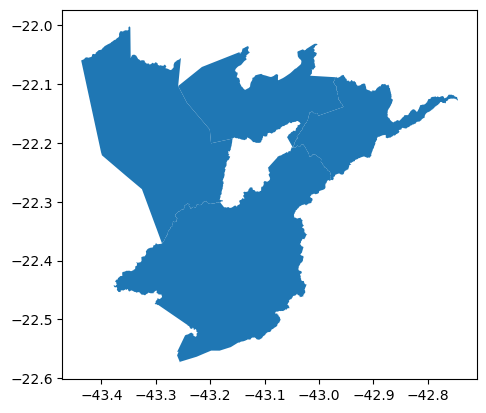

In [ ]:
df_malha_municipios.loc[cod_vizinhanca].plot()

In [ ]:
df_malha_municipios.loc[cod_vizinhanca]

,desc_municipio,sigla_uf,area_km2,geometry
cod_municipio,,,,
3303708,Paraíba do Sul,RJ,571.118,"POLYGON ((-43.31703 -22.29965, -43.32446 -22.2..."
3303906,Petrópolis,RJ,791.144,"POLYGON ((-43.02920 -22.39222, -43.02899 -22.3..."
3305158,São José do Vale do Rio Preto,RJ,220.178,"POLYGON ((-42.90584 -22.11211, -42.90560 -22.1..."
3306008,Três Rios,RJ,322.843,"POLYGON ((-43.23685 -22.13806, -43.23831 -22.1..."


In [ ]:
len(df_perim_rj)

62739

In [ ]:
# trazendo as info de temas amb (data inscrição e código ibge) para a base de perimetros
df_perim_rj =  df_perim_rj.merge(
                             temas_amb[['registro_car', 'data_inscricao', 'codigo_ibge']],
                             how = 'left',
                             left_on = 'cod_imovel',
                             right_on = 'registro_car')

In [ ]:
df_perim_rj.head(1)

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,registro_car,data_inscricao,codigo_ibge
0,area_imovel,area do imovel,rj-3301009-aa4f141ff7ed499cbfcafad7e4cc6a41,3.996,47.9525,pe,iru,"analisado, aguardando atendimento a notificacao",campos dos goytacazes,rj,"POLYGON ((-41.27580 -21.75925, -41.27580 -21.7...",rj-3301009-aa4f141ff7ed499cbfcafad7e4cc6a41,2018-09-28,3301009.0


In [ ]:
# muitos imóveis não tem na base temas ambientais (que vai até final de 2022 só)
df_perim_rj.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 62739 entries, 0 to 62738
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   cod_tema        62739 non-null  object  
 1   nom_tema        62739 non-null  object  
 2   cod_imovel      62739 non-null  object  
 3   mod_fiscal      62739 non-null  float64 
 4   num_area        62739 non-null  float64 
 5   ind_status      62739 non-null  object  
 6   ind_tipo        62739 non-null  object  
 7   des_condic      62739 non-null  object  
 8   municipio       62739 non-null  object  
 9   cod_estado      62739 non-null  object  
 10  geometry        62739 non-null  geometry
 11  registro_car    58826 non-null  object  
 12  data_inscricao  58826 non-null  object  
 13  codigo_ibge     58826 non-null  float64 
dtypes: float64(3), geometry(1), object(10)
memory usage: 6.7+ MB


In [ ]:
# dropar os nulos
df_perim_rj = df_perim_rj[df_perim_rj['registro_car'].notnull()]

In [ ]:
df_perim_rj['codigo_ibge'] = df_perim_rj['codigo_ibge'].astype(str)
df_perim_rj['codigo_ibge'] = df_perim_rj['codigo_ibge'].str.slice(0,7)

In [ ]:
# os vizinhos de Areal + areal
cod_intermun = cod_vizinhanca.tolist()
cod_intermun.append('3300225')
cod_intermun

['3303708', '3303906', '3305158', '3306008', '3300225']

### dfs Intermun

Apenas para teste. Na hora de rodar teria de ser o do estado inteiro?

In [ ]:
df_perim_rj_intermun = df_perim_rj[df_perim_rj['codigo_ibge'].isin(cod_intermun)]
df_malha_municipios_intermun = df_malha_municipios.loc[cod_intermun]
df_perim_rj_intermun['municipio'].value_counts()

municipio
petropolis                       830
paraiba do sul                   705
sao jose do vale do rio preto    514
tres rios                        289
areal                            169
Name: count, dtype: int64

## Transformations

In [ ]:
# df_perim
df_perim_rj_intermun['geometry'] = df_perim_rj_intermun['geometry'].to_crs(crs=6933)
df_perim_rj_intermun['geometry_4674'] = df_perim_rj_intermun['geometry'].to_crs(crs=4674)
df_perim_rj_intermun['vlr_area']  = df_perim_rj_intermun['geometry'].area/10000
df_perim_rj_intermun = df_perim_rj_intermun[
                   (df_perim_rj_intermun['des_condic'] != 'cancelado por decisao administrativa')
                 & (df_perim_rj_intermun['des_condic'] != 'cancelado por duplicidade')
                 & (df_perim_rj_intermun['des_condic'] != 'cancelado por solicitacao do proprietario/possuidor')
                            ]
df_perim_rj_intermun['sequencia'] = range(1, len(df_perim_rj_intermun) + 1)

In [ ]:
# malha mun
df_malha_municipios_intermun['geometry'] = df_malha_municipios_intermun['geometry'].to_crs(crs=6933)
df_malha_municipios_intermun['geometry_4674'] = df_malha_municipios_intermun['geometry'].to_crs(crs=4674)
df_malha_municipios_intermun.reset_index(inplace=True)

In [ ]:
df_perim_rj_intermun.head(1)

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,registro_car,data_inscricao,codigo_ibge,geometry_4674,vlr_area,sequencia
29468,area_imovel,area do imovel,rj-3306008-b5a2530266114e129cfd787cc2b029c0,5.1285,143.5968,at,iru,aguardando analise,tres rios,rj,"POLYGON ((-4150373.421 -2754492.971, -4151296....",rj-3306008-b5a2530266114e129cfd787cc2b029c0,2018-03-24,3306008,"POLYGON ((-43.01517 -22.12345, -43.02473 -22.1...",143.563468,1


In [ ]:
df_malha_municipios_intermun.head(1)

,cod_municipio,desc_municipio,sigla_uf,area_km2,geometry,geometry_4674
0,3303708,Paraíba do Sul,RJ,571.118,"POLYGON ((-4179499.574 -2775343.285, -4180216....","POLYGON ((-43.31703 -22.29965, -43.32446 -22.2..."


## Viz

### Sem malha municipal

In [ ]:
df_limpo_data_viz = df_perim_rj_intermun.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )



    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

### C/malha municipal

In [ ]:
df_limpo_data_viz = df_perim_rj_intermun.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           #color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    # Second trace for df_malha_municipios
    malha_mun = px.choropleth_mapbox(df_malha_municipios_intermun,
                           geojson=df_malha_municipios_intermun['geometry_4674'],
                           color=df_malha_municipios_intermun['desc_municipio'],  # replace with appropriate column
                           locations=df_malha_municipios_intermun.index,
                           mapbox_style="open-street-map",
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           opacity=0.5)

    for trace in malha_mun.data:
            fig.add_trace(trace)

    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

## Algoritmo inter-cidade

### Exemplo

<Axes: >

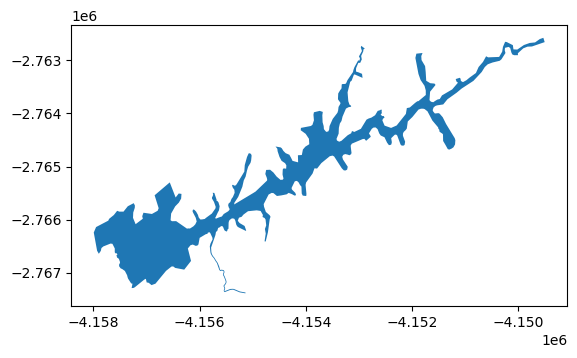

In [ ]:
# o imóvel do rio em areal faz interseção com os 4 municipios
# e com imóveis em todos eles
df_perim_rj_intermun[df_perim_rj_intermun['sequencia'] == 2365].plot()

In [ ]:
df_perim_rj_intermun[df_perim_rj_intermun['sequencia'] == 2365]['cod_imovel']

40570    rj-3303906-abfc172c7c0b4a76a0e1d5e343a79bf7
Name: cod_imovel, dtype: object

In [ ]:
df_perim_rj_intermun.head(1)

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,registro_car,data_inscricao,codigo_ibge,geometry_4674,vlr_area,sequencia
29468,area_imovel,area do imovel,rj-3306008-b5a2530266114e129cfd787cc2b029c0,5.1285,143.5968,at,iru,aguardando analise,tres rios,rj,"POLYGON ((-4150373.421 -2754492.971, -4151296....",rj-3306008-b5a2530266114e129cfd787cc2b029c0,2018-03-24,3306008,"POLYGON ((-43.01517 -22.12345, -43.02473 -22.1...",143.563468,1


In [ ]:
df_malha_municipios_intermun.head(1)

,cod_municipio,desc_municipio,sigla_uf,area_km2,geometry,geometry_4674
0,3303708,Paraíba do Sul,RJ,571.118,"POLYGON ((-4179499.574 -2775343.285, -4180216....","POLYGON ((-43.31703 -22.29965, -43.32446 -22.2..."


In [ ]:
# para Areal
cod_municipio = '3300225'
df_perim_rj_intermun_areal = df_perim_rj_intermun[df_perim_rj_intermun['codigo_ibge'] == cod_municipio]
df_malha_municipios_vizinhos = df_malha_municipios_intermun.query("cod_municipio != @cod_municipio")

In [ ]:
# de todos os codigos de areal
cod_imoveis_areal = df_perim_rj_intermun_areal['cod_imovel'].unique()

In [ ]:
dict_cod_imoveis_com_intersecao_nos_municipios_vizinhos = {}

for cod_imovel in cod_imoveis_areal:
    df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_imovel,
                                                                df_perim_rj_intermun_areal)
    df_intersection = df_propriedade_a.overlay(df_malha_municipios_vizinhos,
                                 how='intersection',
                                 keep_geom_type=True)
    if df_intersection.empty:
        pass
    else:
        dict_cod_imoveis_com_intersecao_nos_municipios_vizinhos[f'{cod_imovel}'] = (
                [cod_ibge_vizinho for cod_ibge_vizinho in df_intersection['cod_municipio'].unique()])


In [ ]:
# qual o código do imóvel e quais os codigos dos municipios com os quais ele
# tem interseção
dict_cod_imoveis_com_intersecao_nos_municipios_vizinhos

{'rj-3300225-1b05785ffade4a71b9ee37fe31618498': ['3303906'],
 'rj-3300225-730982e53732474a958aa39091e69ef7': ['3303906'],
 'rj-3300225-d11bbf0810ac4661b6756f9593759661': ['3306008'],
 'rj-3300225-81c529eb4374421890bde98f21ecf6d4': ['3303708'],
 'rj-3300225-ad8440437d5747a381ad7094d62b076f': ['3303708'],
 'rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846': ['3303906',
  '3305158',
  '3306008'],
 'rj-3300225-bafe8780364f49dea5c8af1b1841bd5c': ['3303906'],
 'rj-3300225-01cb7f1d0d4c4dc187f297ddfedb807e': ['3303906'],
 'rj-3300225-1f3b571707ce46edb1eba2ecf6f70593': ['3306008'],
 'rj-3300225-31848ba9fede4a0d85032ff39a933f66': ['3306008'],
 'rj-3300225-380026d22bb14ef1a0e682b2d0f9d482': ['3303906'],
 'rj-3300225-3a593de6be1547649119cb72f1d65694': ['3303906'],
 'rj-3300225-3fa6bd77c00f4b95b85db0adc76c4e3e': ['3303906'],
 'rj-3300225-526c1ea338424a5090b3086c97de4b13': ['3306008'],
 'rj-3300225-4fa701c06de24550a05104fb2a4d8dc7': ['3303708'],
 'rj-3300225-591d07a5757043ef8b487d830e6687dd': ['3303708',

#### Para 1 imóvel

In [ ]:
# para um código
cod_a = 'rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846' # o rio de areal
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df_perim_rj_intermun_areal)
#df_cod = df_perim_rj_intermun_areal.query("cod_imovel == @cod_imovel")

In [ ]:
df_intersection = df_propriedade_a.overlay(df_malha_municipios_vizinhos,
                                 how='intersection',
                                 keep_geom_type=True)
df_intersection.head(1)

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,registro_car,data_inscricao,codigo_ibge,geometry_4674_1,vlr_area,sequencia,cod_municipio,desc_municipio,sigla_uf,area_km2,geometry_4674_2,geometry
0,area_imovel,area do imovel,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,29.1579,468.8179,pe,iru,"analisado, aguardando atendimento a notificacao",areal,rj,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2017-12-30,3300225,"POLYGON ((-43.08834 -22.21940, -43.08750 -22.2...",468.730885,2365,3303906,Petrópolis,RJ,791.144,"POLYGON ((-43.02920 -22.39222, -43.02899 -22.3...","POLYGON ((-4151256.077 -2764664.395, -4151299...."


In [ ]:
cod_municipios_vizinhos = df_intersection['cod_municipio'].unique()
cod_municipios_vizinhos

array(['3303906', '3305158', '3306008'], dtype=object)

In [ ]:
# escolhendo um dos municipios vizinhos - Petropolis
cod_municipio_vizinho = cod_municipios_vizinhos[0] # petropolis
df_perim_rj_intermun_vizinho = df_perim_rj_intermun.query("codigo_ibge == @cod_municipio_vizinho")
cod_imoveis_vizinhos = df_perim_rj_intermun_vizinho['cod_imovel'].unique()

In [ ]:
len(df_perim_rj_intermun_vizinho)

830

In [ ]:
# pegando um dos cod de petropolis que sabemos que o cod de areal tem interseção
# para testar
cod_b = df_perim_rj_intermun_vizinho.query("sequencia == 1507")['cod_imovel'].iloc[0]

In [ ]:
cod_a, cod_b

('rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846',
 'rj-3303906-8a1cfd60c83544d585b0ececd9340471')

In [ ]:
cod_a =  'rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846' # o rio
#cod_b = 'rj-3303906-8a1cfd60c83544d585b0ececd9340471' # 1507
cod_b = 'rj-3303906-abfc172c7c0b4a76a0e1d5e343a79bf7' # 1114
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a,
                                                            df_perim_rj_intermun) # pode trocar
df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b,
                                                            df_perim_rj_intermun) # pode trocar
df_intersection = df_propriedade_a.overlay(df_propriedade_b,
                                           how='intersection',
                                           keep_geom_type=True)

('2017-12-30', '2021-09-21', <Axes: >)

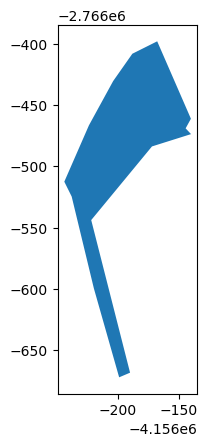

In [ ]:
data_a, data_b, df_intersection.plot() # o rio é mais novo, tem que subtrair do B

In [ ]:
# fazendo uma cópia do df intermun para podermos alterar e testar
df_perim_rj_intermun2 = df_perim_rj_intermun.copy()

In [ ]:
classificacao = resolver_e_classificar_intersecoes_no_dataframe(df = df_perim_rj_intermun2,
                                               prioridade_mesma_propriedade=False)
classificacao

'intersecao_areas_diferentes'

<Axes: >

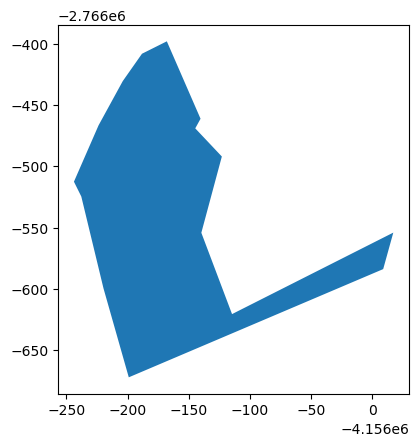

In [ ]:
# deu certo! atualizou a geometria
df_perim_rj_intermun2.query("cod_imovel == @cod_b").plot()

In [ ]:
df_perim_rj_intermun2['geometry_4674'] = df_perim_rj_intermun2['geometry'].to_crs(4674)
df_limpo_data_viz = df_perim_rj_intermun2.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           #color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    # Second trace for df_malha_municipios
    malha_mun = px.choropleth_mapbox(df_malha_municipios_intermun,
                           geojson=df_malha_municipios_intermun['geometry_4674'],
                           color=df_malha_municipios_intermun['desc_municipio'],  # replace with appropriate column
                           locations=df_malha_municipios_intermun.index,
                           mapbox_style="open-street-map",
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           opacity=0.5)

    for trace in malha_mun.data:
            fig.add_trace(trace)

    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

#### Para todos

In [ ]:
df_perim_rj_intermun.head(1)

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,registro_car,data_inscricao,codigo_ibge,geometry_4674,vlr_area,sequencia
29468,area_imovel,area do imovel,rj-3306008-b5a2530266114e129cfd787cc2b029c0,5.1285,143.5968,at,iru,aguardando analise,tres rios,rj,"POLYGON ((-4150373.421 -2754492.971, -4151296....",rj-3306008-b5a2530266114e129cfd787cc2b029c0,2018-03-24,3306008,"POLYGON ((-43.01517 -22.12345, -43.02473 -22.1...",143.563468,1


In [ ]:
cod_a = 'rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846' # o rio
df_perim_rj_intermun2 = df_perim_rj_intermun.copy()

In [ ]:
# testar o ajuste de interseção do rio com todos os demais DE PETROPOLIS
dict_relatorio = {'cod_a' : [], 'seq_a' : [],
                  'cod_b' : [], 'seq_b' : [],
                  'prior_msm_prop': [],
                  'classificacao' : [],
                  'nivel': []}
df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a,
                                                            df_perim_rj_intermun)

prioridade_mesma_propriedade = False

for cod_b in cod_imoveis_vizinhos:
    df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b,
                                                                df_perim_rj_intermun)
    if df_propriedade_a is None or df_propriedade_b is None:
        continue # skipar o resto da interação se for None

    df_intersection = df_propriedade_a.overlay(df_propriedade_b,
                                               how='intersection',
                                               keep_geom_type=True)
    # relatorio
    seq_a = df_propriedade_a['sequencia'].iloc[0]
    seq_b = df_propriedade_b['sequencia'].iloc[0]

    if df_intersection.empty:
        classificacao = 'vazia'
    else:
        ##### INSERIR NOVA FUNÇÃO AQUI
        classificacao = resolver_e_classificar_intersecoes_no_dataframe(
                               df = df_perim_rj_intermun2,
                               prioridade_mesma_propriedade = False)
            # preencher relatório após cada interação
    dict_relatorio['cod_a'].append(cod_a)
    dict_relatorio['seq_a'].append(seq_a)
    dict_relatorio['cod_b'].append(cod_b)
    dict_relatorio['seq_b'].append(seq_b)
    dict_relatorio['prior_msm_prop'].append(prioridade_mesma_propriedade)
    dict_relatorio['classificacao'].append(classificacao)
    dict_relatorio['nivel'].append('inter')

    df_perim_rj_intermun2['vlr_area'] = df_perim_rj_intermun2['geometry'].area/10000
# construir a geometria de visualização
df_perim_rj_intermun2['geometry_4674'] = df_perim_rj_intermun2['geometry'].to_crs(crs=4674)

In [ ]:
df_perim_rj_intermun3, dict_relatorio = atualizar_intersecoes_intermunicipais(
    df = df_perim_rj_intermun2,
    prioridade_mesma_propriedade = False)

In [ ]:
[len(dict_relatorio[key]) for key in dict_relatorio.keys()]

[830, 830, 830, 830, 830, 830, 830]

In [ ]:
relat = pd.DataFrame(dict_relatorio)
relat['classificacao'].value_counts()

classificacao
vazia                          824
intersecao_areas_diferentes      6
Name: count, dtype: int64

In [ ]:
relat.query("classificacao == 'intersecao_areas_diferentes'")

,cod_a,seq_a,cod_b,seq_b,prior_msm_prop,classificacao,nivel
119,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2365,rj-3303906-abfc172c7c0b4a76a0e1d5e343a79bf7,1114,False,intersecao_areas_diferentes,inter
147,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2365,rj-3303906-4edae5b386214486809b306abbdbe604,1142,False,intersecao_areas_diferentes,inter
258,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2365,rj-3303906-0ba5d6f6fd2b421988ae4549f4d90473,1253,False,intersecao_areas_diferentes,inter
330,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2365,rj-3303906-2c7c2f6832c04ce694051d272083a1b1,1325,False,intersecao_areas_diferentes,inter
512,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2365,rj-3303906-8a1cfd60c83544d585b0ececd9340471,1507,False,intersecao_areas_diferentes,inter
546,rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846,2365,rj-3303906-93085d2312a84c038f163a25dabd2068,1541,False,intersecao_areas_diferentes,inter


In [ ]:
df_perim_rj_intermun2.query("sequencia == 1114")

,cod_tema,nom_tema,cod_imovel,mod_fiscal,num_area,ind_status,ind_tipo,des_condic,municipio,cod_estado,geometry,registro_car,data_inscricao,codigo_ibge,geometry_4674,vlr_area,sequencia
40570,area_imovel,area do imovel,rj-3303906-abfc172c7c0b4a76a0e1d5e343a79bf7,0.2461,2.461,at,iru,aguardando analise,petropolis,rj,"POLYGON ((-4156198.963 -2766672.369, -4156219....",rj-3303906-abfc172c7c0b4a76a0e1d5e343a79bf7,2021-09-21,3303906,"POLYGON ((-43.07554 -22.22635, -43.07576 -22.2...",2.460594,1114


In [ ]:
#df_perim_rj_intermun2.query("sequencia == 1507").plot()

In [ ]:
#df_perim_rj_intermun2['geometry_4674'] = df_perim_rj_intermun2['geometry'].to_crs(4674)
df_limpo_data_viz = df_perim_rj_intermun3.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           #color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    # Second trace for df_malha_municipios
    malha_mun = px.choropleth_mapbox(df_malha_municipios_intermun,
                           geojson=df_malha_municipios_intermun['geometry_4674'],
                           color=df_malha_municipios_intermun['desc_municipio'],  # replace with appropriate column
                           locations=df_malha_municipios_intermun.index,
                           mapbox_style="open-street-map",
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           opacity=0.5)

    for trace in malha_mun.data:
            fig.add_trace(trace)

    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

#### Erro

Porque o 1114 nao atualizou sendo que ele foi incorporado na relatório?

In [ ]:
df_perim_rj_intermun2 = df_perim_rj_intermun.copy()

In [ ]:

cod_a =  'rj-3300225-6eabeb8f671e4f67a8cff2f29ed79846' # o rio

cods = ['rj-3303906-abfc172c7c0b4a76a0e1d5e343a79bf7', # 1114 -> problema
        #'rj-3303906-4edae5b386214486809b306abbdbe604', # 1142 -> problema
        #'rj-3303906-0ba5d6f6fd2b421988ae4549f4d90473', # 1253
        #'rj-3303906-2c7c2f6832c04ce694051d272083a1b1', # 1325
        #'rj-3303906-8a1cfd60c83544d585b0ececd9340471', # 1507
        #'rj-3303906-93085d2312a84c038f163a25dabd2068'  # 1541
       ]

df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a,
                                                            df_perim_rj_intermun2)

prioridade_mesma_propriedade = False

for cod_b in cods:
    df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b,
                                                                df_perim_rj_intermun2)
    df_intersection = df_propriedade_a.overlay(df_propriedade_b,
                                               how='intersection',
                                               keep_geom_type=True)
    if data_a > data_b:
        nova_geometria = df_propriedade_b.difference(df_propriedade_a, align=False).iloc[0]
        df_perim_rj_intermun2.loc[df_perim_rj_intermun2['cod_imovel'] == cod_b, 'geometry'] = nova_geometria
        print(f'{cod_b} atualizado')
    elif data_a < data_b:
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        df_perim_rj_intermun2.loc[df_perim_rj_intermun2['cod_imovel'] == cod_a, 'geometry'] = nova_geometria
        print(f'{cod_a} atualizado')
    else: # para fins analíticos, tanto faz qual atualiza se não temos mais outra referencia para usar
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        df_perim_rj_intermun2.loc[df_perim_rj_intermun2['cod_imovel'] == cod_a, 'geometry'] = nova_geometria
        print(f'{cod_a} atualizado')
    # resolver_e_classificar_intersecoes_no_dataframe(
    #                        df = df_perim_rj_intermun2,
    #                        prioridade_mesma_propriedade = False)

    df_perim_rj_intermun2['vlr_area'] = df_perim_rj_intermun2['geometry'].area/10000
# construir a geometria de visualização
df_perim_rj_intermun2['geometry_4674'] = df_perim_rj_intermun2['geometry'].to_crs(crs=4674)

In [ ]:
#df_perim_rj_intermun2['geometry_4674'] = df_perim_rj_intermun2['geometry'].to_crs(4674)
df_limpo_data_viz = df_perim_rj_intermun2.copy()

def create_choropleth(selected_location=None):
    fig = px.choropleth_mapbox(df_limpo_data_viz,
                           geojson = df_limpo_data_viz['geometry_4674'], # which column contains the poligons
                           #color = df_limpo_data_viz['vlr_area'], # which value should we plot in each spatial unit (poligon)
                           locations = df_limpo_data_viz.index,
                           # different options
                           mapbox_style="open-street-map",
                           # for mapbox, we must fit locations manually through center and zoom args
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           hover_data = {'sequencia': True}
                           # mapbox has opacity arg insice choropleth_mapbox()
                           #opacity = 0.6  # [0,1] interval
                           )
    # Second trace for df_malha_municipios
    malha_mun = px.choropleth_mapbox(df_malha_municipios_intermun,
                           geojson=df_malha_municipios_intermun['geometry_4674'],
                           color=df_malha_municipios_intermun['desc_municipio'],  # replace with appropriate column
                           locations=df_malha_municipios_intermun.index,
                           mapbox_style="open-street-map",
                           center={"lat": -22.10, "lon": -43.20},
                           zoom=8,
                           opacity=0.5)

    for trace in malha_mun.data:
            fig.add_trace(trace)

    fig.update_geos(fitbounds="locations",
                    visible=True,
                    )
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0}, uirevision='constant')
    fig.update_traces(marker_opacity=0.5)

    if selected_location is not None:
        fig.update_traces(marker=dict(line=dict(color='red', width=2)))
        fig.data[0].marker.line.color = [
            'red' if loc == selected_location else 'black' for loc in df_limpo_data_viz.index
        ]
        fig.data[0].marker.line.width = [
            2 if loc == selected_location else 0.5 for loc in df_limpo_data_viz.index
        ]

    return fig

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.Graph(id='choropleth', figure=create_choropleth()),
    dcc.Store(id='selected-location')
])

@app.callback(
    Output('choropleth', 'figure'),
    Input('choropleth', 'clickData'),
    Input('selected-location', 'data')
)

def update_choropleth(clickData, selected_location):
    ctx = dash.callback_context

    if ctx.triggered and ctx.triggered[0]['prop_id'] == 'choropleth.clickData' and clickData:
        selected_location = clickData['points'][0]['location']
    return create_choropleth(selected_location)

if __name__ == '__main__':
    app.run_server(debug=True, port=8051)

### funções

#### Base

In [ ]:
def extrair_info_propriedade(cod_imovel, df):
    df_propriedade = df[df['cod_imovel'] == cod_imovel]
    if df_propriedade.empty:
        return None, None, None
    area = df[df['cod_imovel'] == cod_imovel]['vlr_area'].iloc[0]
    data = df[df['cod_imovel'] == cod_imovel]['data_inscricao'].iloc[0]
    return df_propriedade, area, data

# funções para dropar geometria
def dropar_imovel_do_dataframe(cod_imovel, df):
    df.drop(df.loc[df['cod_imovel'] == cod_imovel].index, inplace=True)

def dropar_geometria_mais_antiga(cod_a, cod_b,
                                 data_a, data_b,
                                 df):
    if data_a > data_b:
        dropar_imovel_do_dataframe(cod_b, df)
    elif data_a < data_b:
        dropar_imovel_do_dataframe(cod_a, df)
    else: # para fins analíticos, tanto faz qual dropa
        dropar_imovel_do_dataframe(cod_b, df)

# funções para atualizar geometria
def atualizar_geometria(df, cod_imovel, nova_geometria):
    df.loc[df['cod_imovel'] == cod_imovel, 'geometry'] = nova_geometria

def desmembramento_ou_juncao(nova_geometria):
    if nova_geometria.area == 0:
        return 'juncao'
    else:
        return 'desmembramento'

def atualizar_geometria_mais_antiga(cod_a, cod_b,
                                    data_a, data_b,
                                    df_propriedade_a, df_propriedade_b,
                                    df,
                                    identificar_desmembramento_ou_juncao = False):
    classificacao = None
    if data_a > data_b:
        nova_geometria = df_propriedade_b.difference(df_propriedade_a, align=False).iloc[0]
        atualizar_geometria(df, cod_b, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    elif data_a < data_b:
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        atualizar_geometria(df, cod_a, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    else: # para fins analíticos, tanto faz qual atualiza se não temos mais outra referencia para usar
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        atualizar_geometria(df, cod_a, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    return classificacao

# funções para lidar com os restos de polígonos após os calculos de atualização de geometria
def extrair_multipoligonos(geometry):
    if geometry.geom_type == 'GeometryCollection':
        return [geom for geom in geometry.geoms if geom.geom_type in ['Polygon', 'MultiPolygon']]
    else:
        return geometry

def resolver_multipoligonos(df):
    df['poligonos'] = df['geometry'].apply(extrair_multipoligonos)
    df = df.explode('poligonos')
    df = df[df['poligonos'].notnull()]
    df.set_geometry('poligonos', inplace=True)
    df['geometry'] = df['poligonos']
    df.reset_index(inplace=True)
    df.drop('index', axis = 1, inplace=True)
    df['geometry'].set_crs(crs = 6933, inplace=True)
    df['vlr_area'] = df['geometry'].area/10000
    df['geometry_4674'] = df['geometry'].to_crs(crs=4674)
    return df

In [ ]:
def resolver_e_classificar_intersecoes_no_dataframe(df,
                                                    prioridade_mesma_propriedade):
    """ Altera o dataframe atualizado e retorna a classificação do caso"""
    alpha = 0.70
    beta = 0.70
    theta = 0.80

    area_intersecao = (df_intersection['geometry'].area / 10000).iloc[0]
    if prioridade_mesma_propriedade:
        classificacao = 'nao_e_mesma_prop'

    if area_a == area_b:
        if area_intersecao == area_a:
            classificacao = 'mesma_propriedade_areas_iguais'
            dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                         data_a = data_a, data_b = data_b,
                                         df = df)
        else:
            if not prioridade_mesma_propriedade:
                classificacao = 'intersecao_areas_iguais'
                atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                              data_a = data_a, data_b = data_b,
                                              df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                              df = df,
                                              identificar_desmembramento_ou_juncao = False)
    else:
        if min(area_a, area_b) >= alpha*max(area_a, area_b): # as areas sao semelhantes
            if area_intersecao >= beta*min(area_a, area_b): # a intersecao é grande
                classificacao = 'mesma_propriedade_areas_diferentes'
                dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                          data_a = data_a, data_b = data_b,
                                          df = df)
            else:
                if not prioridade_mesma_propriedade:
                    classificacao = 'intersecao_areas_semelhantes_intersecao_pequena'
                    atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                  data_a = data_a, data_b = data_b,
                                                  df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                  df = df)
        else:
            if not prioridade_mesma_propriedade:
                if area_intersecao >= theta*min(area_a, area_b):
                    classificacao = 'intersecao_desmembramento_ou_juncao'
                    classificacao = atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                  data_a = data_a, data_b = data_b,
                                                  df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                  df = df,
                                                  identificar_desmembramento_ou_juncao = True)
                else:
                    classificacao = 'intersecao_areas_diferentes'
                    atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                  data_a = data_a, data_b = data_b,
                                                  df_propriedade_a = df_propriedade_a,
                                                    df_propriedade_b = df_propriedade_b,
                                                  df = df)
    return classificacao

#### Main

In [ ]:
def identificar_e_transformar_propriedades_na_mesma_cidade(df,
                                                           prioridade_mesma_propriedade = True,
                                                           dict_relatorio = None):

    cod_imoveis_unicos = df['cod_imovel'].unique().tolist()
    combinacoes = list(itertools.combinations(cod_imoveis_unicos, 2))

    # criar relatório se nao existe
    # global dict_relatorio
    if dict_relatorio is None:
        dict_relatorio = {'cod_a' : [], 'seq_a' : [],
                          'cod_b' : [], 'seq_b' : [], 'classificacao' : []}

    for cod_a, cod_b in tqdm(combinacoes, leave=False):
        df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df)
        df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df)

        if df_propriedade_a is None or df_propriedade_b is None:
            continue # skipar o resto da interação se for None

        df_intersection = df_propriedade_a.overlay(df_propriedade_b,
                                                   how='intersection',
                                                   keep_geom_type=True)
        # relatorio
        seq_a = df_propriedade_a['sequencia'].iloc[0]
        seq_b = df_propriedade_b['sequencia'].iloc[0]
        classificacao = 'nao_definida' # detectar furos na estrutura de if/else

        if df_intersection.empty:
            classificacao = 'vazia'
        else:
            classificacao = resolver_e_classificar_intersecoes_no_dataframe(
                                    df = df,
                                    prioridade_mesma_propriedade = prioridade_mesma_propriedade)
        # preencher relatório após cada interação
        dict_relatorio['cod_a'].append(cod_a)
        dict_relatorio['seq_a'].append(seq_a)
        dict_relatorio['cod_b'].append(cod_b)
        dict_relatorio['seq_b'].append(seq_b)
        dict_relatorio['classificacao'].append(classificacao)

        df['vlr_area'] = df['geometry'].area/10000
    # construir a geometria de visualização
    df['geometry_4674'] = df['geometry'].to_crs(crs=4674)

    return df, dict_relatorio

#### Wrap

In [ ]:
def gerar_dataframe_e_relatorio_tratado_por_municipio(df):
    df, dict_relatorio = identificar_e_transformar_propriedades_na_mesma_cidade(
                                        df,
                                        prioridade_mesma_propriedade = True)
    # resolvidas as propriedades iguais, agora vamos para as interseções
    df, dict_relatorio = identificar_e_transformar_propriedades_na_mesma_cidade(
                                        df,
                                        prioridade_mesma_propriedade = False,
                                        dict_relatorio = dict_relatorio)
    df = resolver_multipoligonos(df)
    # talvez depois incluir um drop para geometrias menores que x area
    # que podem ser pequenos restos dos multipoligonos
    return df, dict_relatorio

# Lixo

def extrair_info_propriedade(cod_imovel, df):
    df_propriedade = df[df['cod_imovel'] == cod_imovel]
    if df_propriedade.empty:
        return None, None, None
    area = df[df['cod_imovel'] == cod_imovel]['vlr_area'].iloc[0]
    data = df[df['cod_imovel'] == cod_imovel]['data_inscricao'].iloc[0]
    return df_propriedade, area, data


def dropar_imovel_do_dataframe(cod_imovel, df):### funções para dropar geometria
    df.drop(df.loc[df['cod_imovel'] == cod_imovel].index, inplace=True)

def dropar_geometria_mais_antiga(cod_a, cod_b,
                                 data_a, data_b,
                                 df):
    if data_a > data_b:
        dropar_imovel_do_dataframe(cod_b, df)
    elif data_a < data_b:
        dropar_imovel_do_dataframe(cod_a, df)
    else: # para fins analíticos, tanto faz qual dropa
        dropar_imovel_do_dataframe(cod_b, df)


def atualizar_geometria(df, cod_imovel, nova_geometria):### funções para atualizar geometria
    df.loc[df['cod_imovel'] == cod_imovel, 'geometry'] = nova_geometria

def desmembramento_ou_juncao(nova_geometria):
    if nova_geometria.area == 0:
        return 'juncao'
    else:
        return 'desmembramento'

def atualizar_geometria_mais_antiga(cod_a, cod_b,
                                    data_a, data_b,
                                    df_propriedade_a, df_propriedade_b,
                                    df = df_perim_rj_areal,
                                    identificar_desmembramento_ou_juncao = False):    
    classificacao = None
    if data_a > data_b:
        nova_geometria = df_propriedade_b.difference(df_propriedade_a, align=False).iloc[0]
        atualizar_geometria(df, cod_b, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    elif data_a < data_b:
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        atualizar_geometria(df, cod_a, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    else: # para fins analíticos, tanto faz qual atualiza se não temos mais outra referencia para usar
        nova_geometria = df_propriedade_a.difference(df_propriedade_b, align=False).iloc[0]
        atualizar_geometria(df, cod_a, nova_geometria)
        if identificar_desmembramento_ou_juncao == True:
            classificacao = desmembramento_ou_juncao(nova_geometria)
    return classificacao

def identificar_e_transformar_propriedades_na_mesma_cidade(df,
                                                           prioridade_mesma_propriedade = True,
                                                           dict_relatorio = None):
    alpha = 0.70
    beta = 0.70
    theta = 0.80
    
    cod_imoveis_unicos = df['cod_imovel'].unique().tolist()
    combinacoes = list(itertools.combinations(cod_imoveis_unicos, 2))

    # criar relatório se nao existe
    # global dict_relatorio
    if dict_relatorio is None:
        #global dict_relatorio # se ta no return não precisa do global
        dict_relatorio = {'cod_a' : [], 'seq_a' : [],
                          'cod_b' : [], 'seq_b' : [], 'classificacao' : []}
        
    for cod_a, cod_b in tqdm(combinacoes, leave=False):
        df_propriedade_a, area_a, data_a = extrair_info_propriedade(cod_a, df)
        df_propriedade_b, area_b, data_b = extrair_info_propriedade(cod_b, df)

        if df_propriedade_a is None or df_propriedade_b is None:
            continue # skipar o resto da interação se for None

        df_intersection = df_propriedade_a.overlay(df_propriedade_b,
                                                   how='intersection',
                                                   keep_geom_type=True)
        # relatorio
        seq_a = df_propriedade_a['sequencia'].iloc[0]
        seq_b = df_propriedade_b['sequencia'].iloc[0]
        classificacao = 'nao_definida' # detectar furos na estrutura de if/else
        
        if df_intersection.empty:
            classificacao = 'vazia'
        else:
            area_intersecao = (df_intersection['geometry'].area / 10000).iloc[0]
            if area_a == area_b:
                if area_intersecao == area_a:
                    classificacao = 'mesma_propriedade_areas_iguais'
                    dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                 data_a = data_a, data_b = data_b,
                                                 df = df)
                else:
                    if not prioridade_mesma_propriedade:
                        classificacao = 'intersecao_areas_iguais'
                        atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                      data_a = data_a, data_b = data_b,
                                                      df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                      df = df,
                                                      identificar_desmembramento_ou_juncao = False)
            else:
                if min(area_a, area_b) >= alpha*max(area_a, area_b): # as areas sao semelhantes
                    if area_intersecao >= beta*min(area_a, area_b): # a intersecao é grande
                        classificacao = 'mesma_propriedade_areas_diferentes'
                        dropar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                  data_a = data_a, data_b = data_b,
                                                  df = df)
                    else:
                        if not prioridade_mesma_propriedade:
                            classificacao = 'intersecao_areas_semelhantes_intersecao_pequena'
                            atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                          data_a = data_a, data_b = data_b,
                                                          df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                          df = df)
                else:
                    if not prioridade_mesma_propriedade:
                        if area_intersecao >= theta*min(area_a, area_b):
                            classificacao = 'intersecao_desmembramento_ou_juncao'
                            atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                          data_a = data_a, data_b = data_b,
                                                          df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                          df = df,
                                                          identificar_desmembramento_ou_juncao = True)
                        else:
                            classificacao = 'intersecao_areas_diferentes'
                            atualizar_geometria_mais_antiga(cod_a = cod_a, cod_b = cod_b,
                                                          data_a = data_a, data_b = data_b,
                                                          df_propriedade_a = df_propriedade_a, df_propriedade_b = df_propriedade_b,
                                                          df = df)
        
        df['vlr_area'] = df['geometry'].area/10000
        
        # preencher relatório após cada interação
        dict_relatorio['cod_a'].append(cod_a)
        dict_relatorio['seq_a'].append(seq_a)
        dict_relatorio['cod_b'].append(cod_b)
        dict_relatorio['seq_b'].append(seq_b)
        dict_relatorio['classificacao'].append(classificacao)

    # construir a geometria de visualização
    df['geometry_4674'] = df['geometry'].to_crs(crs=4674)
    
    return df, dict_relatorio
    

def gerar_dataframe_e_relatorio_tratado_por_municipio(df):
    df, dict_relatorio = identificar_e_transformar_propriedades_na_mesma_cidade(
                                        df,
                                        prioridade_mesma_propriedade = True)
    
    df, dict_relatorio = identificar_e_transformar_propriedades_na_mesma_cidade(
                                        df,
                                        prioridade_mesma_propriedade = False,
                                        dict_relatorio = dict_relatorio)
    return df, dict_relatorio